## Solve a 3x3 Rubiks cube

In [28]:
# Import required packages
import numpy as np
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib as mpl
mpl.rc('animation', html='jshtml')
from pyvirtualdisplay import Display

In [2]:
# Import custom functions
from rotate_side import right, left, top, bottom, front, back
from algorithms import t_perm, y_perm
from solve import edges, corners
from visualization import plot_cube

In [3]:
# Function to take input from user

def input_cube(ip:str):
    
    ip = ip.upper().replace(" ","").split(",")
    c = np.array([[" ", " ", " ", ip[0][0], ip[0][1], ip[0][2], " ", " ", " ", " ", " ", " "],
                  [" ", " ", " ", ip[0][3], ip[0][4], ip[0][5], " ", " ", " ", " ", " ", " "],
                  [" ", " ", " ", ip[0][6], ip[0][7], ip[0][8], " ", " ", " ", " ", " ", " "],
   [ip[1][0], ip[1][1], ip[1][2], ip[2][0], ip[2][1], ip[2][2], ip[3][0], ip[3][1], ip[3][2], ip[4][0], ip[4][1], ip[4][2]],
   [ip[1][3], ip[1][4], ip[1][5], ip[2][3], ip[2][4], ip[2][5], ip[3][3], ip[3][4], ip[3][5], ip[4][3], ip[4][4], ip[4][5]],
   [ip[1][6], ip[1][7], ip[1][8], ip[2][6], ip[2][7], ip[2][8], ip[3][6], ip[3][7], ip[3][8], ip[4][6], ip[4][7], ip[4][8]],
                  [" ", " ", " ", ip[5][0], ip[5][1], ip[5][2], " ", " ", " ", " ", " ", " "],
                  [" ", " ", " ", ip[5][3], ip[5][4], ip[5][5], " ", " ", " ", " ", " ", " "],
                  [" ", " ", " ", ip[5][6], ip[5][7], ip[5][8], " ", " ", " ", " ", " ", " "]])
    
    return c


In [4]:
cube = input_cube("GGGGGGGGG, RRRRRRRRR, WWWWWWWWW, OOOOOOOOO, YYYYYYYYY, BBBBBBBBB")
print(cube)

[[' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']]


In [5]:
# Trick1 
# (R U R' U')x6

s = cube.copy()

for i in range(6):
    s = right(s)           # R
    s = top(s)             # U
    s = right(s, False)    # R'
    s = top(s, False)      # U'
    
print(s)

[[' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']]


In [6]:
# Trick2
# (U' L)x63

s = cube.copy()

for i in range(63):
    s = left(top(s, False))
    
print(s)

[[' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']]


In [7]:
# Decorator function

def reverse_rotation(func):
    def inner(cube, clockwise=True):
        return func(cube, False)
    return inner

In [8]:
# Moves encoding

moves = {"R": right,
         "R'": reverse_rotation(right),
         "L": left,
         "L'": reverse_rotation(left),
         "F": front,
         "F'": reverse_rotation(front),
         "B": back,
         "B'": reverse_rotation(back),
         "U": top,
         "U'": reverse_rotation(top),
         "D": bottom,
         "D'": reverse_rotation(bottom)}

In [9]:
# Function to solve entire Cube

def solve_cube(cub):
    #cub = cube.copy()
    edges_cnt = 0
    corners_cnt = 0
    edges_stps = []
    corner_stps = []
    
    while (cub == edges(cub)[0]).min() == False:
        temp1 = edges(cub)
        cub = temp1[0]
        edges_stps += temp1[1]
        edges_cnt += 1
    
    while (cub == corners(cub)[0]).min() == False:
        temp2 = corners(cub)
        cub = temp2[0]
        corner_stps += temp2[1]
        corners_cnt += 1
            
    return cub, edges_stps + corner_stps

In [10]:
# Test1
cube1 = "RYOBGGRRB,GRBBRWYWO,WYYRWWWGR,OOYGOOYRB,GBWWYOWOB,GYGBBGRYO"

test1 = input_cube(cube1)
print(test1)

[[' ' ' ' ' ' 'R' 'Y' 'O' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'R' 'R' 'B' ' ' ' ' ' ' ' ' ' ' ' ']
 ['G' 'R' 'B' 'W' 'Y' 'Y' 'O' 'O' 'Y' 'G' 'B' 'W']
 ['B' 'R' 'W' 'R' 'W' 'W' 'G' 'O' 'O' 'W' 'Y' 'O']
 ['Y' 'W' 'O' 'W' 'G' 'R' 'Y' 'R' 'B' 'W' 'O' 'B']
 [' ' ' ' ' ' 'G' 'Y' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'B' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'R' 'Y' 'O' ' ' ' ' ' ' ' ' ' ' ' ']]


<Axes3DSubplot:>

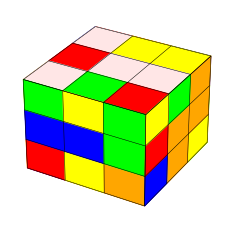

In [11]:
plot_cube(test1)

<Axes3DSubplot:>

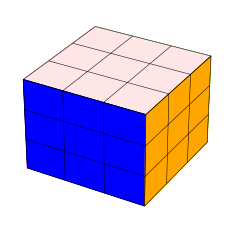

In [13]:
# Solve cube
new_cube, steps = solve_cube(test1)

plot_cube(new_cube)

In [14]:
# Solving steps
print(steps)

['R', 'R', "U'", 'R', 'R', 'R', 'U', "R'", "U'", "R'", 'F', 'R', 'R', "U'", "R'", "U'", 'R', 'U', "R'", "F'", 'R', 'R', 'U', 'R', 'R', 'L', 'L', 'R', 'U', "R'", "U'", "R'", 'F', 'R', 'R', "U'", "R'", "U'", 'R', 'U', "R'", "F'", 'L', 'L', "U'", "F'", 'U', 'R', 'U', "R'", "U'", "R'", 'F', 'R', 'R', "U'", "R'", "U'", 'R', 'U', "R'", "F'", "U'", 'F', 'U', 'U', 'B', "U'", 'R', 'U', "R'", "U'", "R'", 'F', 'R', 'R', "U'", "R'", "U'", 'R', 'U', "R'", "F'", 'U', "B'", "U'", "U'", 'F', 'U', 'R', 'U', "R'", "U'", "R'", 'F', 'R', 'R', "U'", "R'", "U'", 'R', 'U', "R'", "F'", "U'", "F'", 'U', 'R', 'R', 'U', 'R', 'R', 'R', 'U', "R'", "U'", "R'", 'F', 'R', 'R', "U'", "R'", "U'", 'R', 'U', "R'", "F'", 'R', 'R', "U'", 'R', 'R', "D'", 'L', 'U', 'B', "U'", 'R', 'U', "R'", "U'", "R'", 'F', 'R', 'R', "U'", "R'", "U'", 'R', 'U', "R'", "F'", 'U', "B'", "U'", "L'", 'D', 'D', 'L', 'L', 'R', 'U', "R'", "U'", "R'", 'F', 'R', 'R', "U'", "R'", "U'", 'R', 'U', "R'", "F'", 'L', 'L', "D'", 'D', 'D', 'L', 'U', 'B', "U'

In [15]:
# Function to apply steps to a cube

def apply_moves(cube, steps):
    cub = cube.copy()
    for s in steps:
        if s in moves.keys():
            cub = moves[s](cub)
    
    return cub

[[' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'G' 'G' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 ['R' 'R' 'R' 'W' 'W' 'W' 'O' 'O' 'O' 'Y' 'Y' 'Y']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'B' 'B' 'B' ' ' ' ' ' ' ' ' ' ' ' ']]


<Axes3DSubplot:>

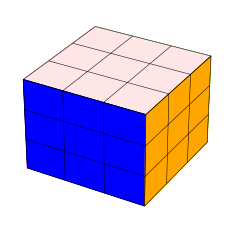

In [16]:
# Recheck test1
# Apply the steps output by solve function

soln = apply_moves(test1, steps)
print(soln)
plot_cube(soln)

[[' ' ' ' ' ' 'R' 'G' 'O' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'R' 'G' 'W' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'Y' 'Y' 'O' ' ' ' ' ' ' ' ' ' ' ' ']
 ['W' 'Y' 'B' 'R' 'G' 'G' 'W' 'B' 'W' 'B' 'R' 'B']
 ['W' 'R' 'O' 'B' 'W' 'R' 'W' 'O' 'Y' 'O' 'Y' 'O']
 ['G' 'B' 'Y' 'G' 'Y' 'O' 'G' 'O' 'Y' 'B' 'G' 'R']
 [' ' ' ' ' ' 'R' 'B' 'Y' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'R' 'B' 'G' ' ' ' ' ' ' ' ' ' ' ' ']
 [' ' ' ' ' ' 'W' 'W' 'O' ' ' ' ' ' ' ' ' ' ' ' ']]


<Axes3DSubplot:>

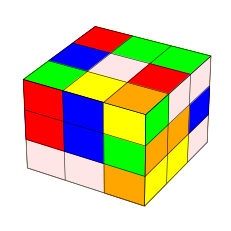

In [17]:
# Test2
cube2 = "RGORGWYYO, WYBWROGBY, RGGBWRGYO, WBWWOYGOY, BRBOYOBGR, RBYRBGWWO"

test2 = input_cube(cube2)
print(test2)
plot_cube(test2)

<Axes3DSubplot:>

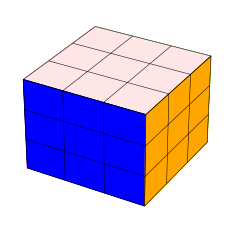

In [18]:
# Solve test2
plot_cube(solve_cube(test2)[0])

In [39]:
# Functions to visualize animation

def update_plot(frame_number, inp, res, plot):
    if frame_number > 0:
        plot[0] = plot_cube(apply_moves(inp, res[1][:frame_number]), ax = plot[0])
    return plot

def plot_anim(inp, repeat=False):
    fig = plt.figure()
    plot = [plot_cube(inp)]

    res = solve_cube(inp)
    nmax = len(res[1])
    anim = animation.FuncAnimation(fig, update_plot, fargs=(inp, res, plot),
                                   frames= nmax+1, repeat=repeat)
    plt.close()

    return anim


In [42]:
# Visualize animation   
plot_anim(test2)

In [21]:
# Save animation
anime = plot_anim(test2)
anime.save("SavingAnimation.gif")